In [2]:
import numpy as np
import gzip
import os
from PIL import Image
import cv2
import json
from scipy.ndimage import gaussian_filter
from skimage.feature import local_binary_pattern

import matplotlib.pyplot as plt
import importlib

import image_feature as imf
importlib.reload(imf)
import itti
importlib.reload(itti) 
import saliencymetr as sm
importlib.reload(sm)

import glob


In [6]:
def display_all_images(data, image, freeview_sample, search_sample, low_features, mid_features, high_features):
    # Plot segmentation map and corresponding image
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(data, cmap='viridis')
    axes[0].set_title("Segmentation Map")
    axes[0].axis('off')
    axes[1].imshow(image)
    axes[1].set_title("Corresponding Image")
    axes[1].axis('off')

    # Draw fixations on segmentation map and image
    imf.draw_fixations(axes[0], freeview_sample, 'red', 'Freeview')
    imf.draw_fixations(axes[0], search_sample, 'blue', 'Search')
    imf.draw_fixations(axes[1], freeview_sample, 'red', 'Freeview')
    imf.draw_fixations(axes[1], search_sample, 'blue', 'Search')

    # Create heatmaps
    heatmap_fig, heatmap_axes = plt.subplots(1, 2, figsize=(12, 6))

    # Generate heatmaps for freeview and search samples
    freeview_heatmap = imf.generate_heatmap(image, freeview_sample, sigma=10)
    search_heatmap = imf.generate_heatmap(image, search_sample, sigma=10)

    # Draw heatmaps
    imf.draw_heatmap(heatmap_axes[0], image, freeview_heatmap, "Freeview Heatmap")
    imf.draw_heatmap(heatmap_axes[1], image, search_heatmap, "Search Heatmap")

    # Plot the extracted features
    # Brightness map
    gray_fig, gray_ax = plt.subplots(figsize=(6, 6))
    gray_ax.imshow(low_features['gray_map'], cmap='gray')
    gray_ax.set_title("gray Map")
    gray_ax.axis('off')

    # bright channels
    brightness_fig, brightness_axes = plt.subplots(1,3,figsize=(15, 5))
    brightness_axes[0].imshow(low_features['brightness_map']['low_brightness'], cmap='gray')
    brightness_axes[0].set_title("Low Brightness")
    brightness_axes[0].axis('off')

    brightness_axes[1].imshow(low_features['brightness_map']['mid_brightness'], cmap='gray')
    brightness_axes[1].set_title("Mid Brightness")
    brightness_axes[1].axis('off')

    brightness_axes[2].imshow(low_features['brightness_map']['high_brightness'], cmap='gray')
    brightness_axes[2].set_title("High Brightness")
    brightness_axes[2].axis('off')

    # color regoins
    colorarea_fig, colorarea_axes = plt.subplots(1, 3, figsize=(15, 5))
    colorarea_axes[0].imshow(low_features['color_regions']['main_color_region'], cmap=plt.cm.colors.ListedColormap([[low_features['color_regions']['main_color'][0]/255, 
                                                                                                           low_features['color_regions']['main_color'][1]/255, 
                                                                                                           low_features['color_regions']['main_color'][2]/255]]))
    colorarea_axes[0].set_title("color_main")
    colorarea_axes[0].axis('off')
    colorarea_axes[1].imshow(low_features['color_regions']['contrast_color_region'], cmap=plt.cm.colors.ListedColormap([[low_features['color_regions']['contrast_color'][0]/255, 
                                                                                                           low_features['color_regions']['contrast_color'][1]/255, 
                                                                                                           low_features['color_regions']['contrast_color'][2]/255]]))
    colorarea_axes[1].set_title("color_contrast")
    colorarea_axes[1].axis('off')

    colorarea_axes[2].imshow(low_features['color_regions']['kmeans_result'])
    colorarea_axes[2].set_title("K-means Result")
    colorarea_axes[2].axis('off')



    # color channels
    color_fig, color_axes = plt.subplots(1, 3, figsize=(15, 5))
    color_axes[0].imshow(low_features['color_channels']['red_channel'], cmap='Reds')
    color_axes[0].set_title("Red Channel")
    color_axes[0].axis('off')

    color_axes[1].imshow(low_features['color_channels']['green_channel'], cmap='Greens')
    color_axes[1].set_title("Green Channel")
    color_axes[1].axis('off')

    color_axes[2].imshow(low_features['color_channels']['blue_channel'], cmap='Blues')
    color_axes[2].set_title("Blue Channel")
    color_axes[2].axis('off')

    # Orientation and texture features
    feature_fig, feature_axes = plt.subplots(1, 2, figsize=(15, 5))
    feature_axes[0].imshow(low_features['orientation_features']['horizontal_orientation_image'], cmap='hsv')
    feature_axes[0].set_title("Horizontal Orientation")
    feature_axes[0].axis('off')

    feature_axes[1].imshow(low_features['orientation_features']['vertical_orientation_image'], cmap='hsv')
    feature_axes[1].set_title("Vertical Orientation")
    feature_axes[1].axis('off')

    texture_fig, texture_axes = plt.subplots(figsize=(6, 6))
    texture_axes.imshow(low_features['texture_features'], cmap='gray')
    texture_axes.set_title("Texture Features")
    texture_axes.axis('off')

    shape_fig, shape_axes = plt.subplots(figsize=(6, 6))
    shape_axes.imshow(mid_features['shape_features']['contours'], cmap='gray')
    shape_axes.set_title("Contours Map")
    shape_axes.axis('off')

    # Spatial relationship features
    spatial_fig, spatial_ax = plt.subplots(figsize=(6, 6))
    spatial_ax.imshow(mid_features['spatial_features']['spatial_image'])
    spatial_ax.set_title("Spatial features")
    spatial_ax.axis('off')

    semantic_fig, semantic_ax = plt.subplots(figsize=(6, 6))
    semantic_ax.imshow(high_features['semantic'], cmap='gray')
    semantic_ax.set_title("Semantic features")
    semantic_ax.axis('off')

    plt.tight_layout()
    plt.show()
    output_dir = '/home/oct/lw/自底向上注意力与自顶向下注意力状态眼动差异分析/images/features'

    # Save all figures
    figures = [fig, heatmap_fig, gray_fig, brightness_fig, colorarea_fig, color_fig, feature_fig, texture_fig, shape_fig, spatial_fig, semantic_fig]
    figure_names = ["segmentation_map", "heatmaps", "graymap", "brightness", "color", "contrast", "orientation", "texture", "contours", "spatial_layout", "semantic"]

    for figure, name in zip(figures, figure_names):
        figure.savefig(os.path.join(output_dir, f"{name}.png"), bbox_inches='tight')
    return freeview_heatmap, search_heatmap


In [23]:
def display_all_saliency_images(sal_images):
    # Plot the extracted saliency features
    # Brightness map
    gray_fig, gray_ax = plt.subplots(figsize=(6, 6))
    gray_ax.imshow(sal_images['gray_map'], cmap='gray')
    gray_ax.set_title("Gray Map")
    gray_ax.axis('off')

    # Brightness channels
    brightness_fig, brightness_axes = plt.subplots(1, 3, figsize=(15, 5))
    brightness_axes[0].imshow(sal_images['low_brightness'], cmap='gray')
    brightness_axes[0].set_title("Low Brightness")
    brightness_axes[0].axis('off')

    brightness_axes[1].imshow(sal_images['mid_brightness'], cmap='gray')
    brightness_axes[1].set_title("Mid Brightness")
    brightness_axes[1].axis('off')

    brightness_axes[2].imshow(sal_images['high_brightness'], cmap='gray')
    brightness_axes[2].set_title("High Brightness")
    brightness_axes[2].axis('off')

    # Color channels
    color_fig, color_axes = plt.subplots(1, 3, figsize=(15, 5))
    color_axes[0].imshow(sal_images['red_channel'], cmap='Reds')
    color_axes[0].set_title("Red Channel")
    color_axes[0].axis('off')

    color_axes[1].imshow(sal_images['green_channel'], cmap='Greens')
    color_axes[1].set_title("Green Channel")
    color_axes[1].axis('off')

    color_axes[2].imshow(sal_images['blue_channel'], cmap='Blues')
    color_axes[2].set_title("Blue Channel")
    color_axes[2].axis('off')

    # Orientation and texture features
    feature_fig, feature_axes = plt.subplots(1, 2, figsize=(15, 5))
    feature_axes[0].imshow(sal_images['horizontal_orientation'], cmap='hsv')
    feature_axes[0].set_title("Horizontal Orientation")
    feature_axes[0].axis('off')

    feature_axes[1].imshow(sal_images['vertical_orientation'], cmap='hsv')
    feature_axes[1].set_title("Vertical Orientation")
    feature_axes[1].axis('off')

    texture_fig, texture_axes = plt.subplots(figsize=(6, 6))
    texture_axes.imshow(sal_images['texture_features'], cmap='gray')
    texture_axes.set_title("Texture Features")
    texture_axes.axis('off')

    # Color regions
    colorarea_fig, colorarea_axes = plt.subplots(1, 3, figsize=(15, 5))
    colorarea_axes[0].imshow(sal_images['color_main_regions'], cmap='gray')
    colorarea_axes[0].set_title("Main Color Regions")
    colorarea_axes[0].axis('off')

    colorarea_axes[1].imshow(sal_images['color_contrast_regions'], cmap='gray')
    colorarea_axes[1].set_title("Contrast Color Regions")
    colorarea_axes[1].axis('off')

    colorarea_axes[2].imshow(sal_images['color_kmeans_regions'], cmap='gray')
    colorarea_axes[2].set_title("K-means Color Regions")
    colorarea_axes[2].axis('off')

    # Contours
    shape_fig, shape_axes = plt.subplots(figsize=(6, 6))
    shape_axes.imshow(sal_images['contours'], cmap='gray')
    shape_axes.set_title("Contours Map")
    shape_axes.axis('off')

    # Spatial relationship features
    spatial_fig, spatial_ax = plt.subplots(figsize=(6, 6))
    spatial_ax.imshow(sal_images['spatial_features'], cmap='gray')
    spatial_ax.set_title("Spatial Features")
    spatial_ax.axis('off')

    # Semantic features
    semantic_fig, semantic_ax = plt.subplots(figsize=(6, 6))
    semantic_ax.imshow(sal_images['semantic_image'], cmap='gray')
    semantic_ax.set_title("Semantic Features")
    semantic_ax.axis('off')

    plt.tight_layout()
    plt.show()

    # Define the output directory
    output_dir = '/home/oct/lw/自底向上注意力与自顶向下注意力状态眼动差异分析/images/saliency/'

    # Save all figures with "_saliency" appended to their names and "features" removed
    figures = [gray_fig, brightness_fig, color_fig, feature_fig, texture_fig, colorarea_fig, shape_fig, spatial_fig, semantic_fig]
    figure_names = ["graymap_saliency", "brightness_saliency", "color_saliency", "orientation_saliency", "texture_saliency", "contrast_saliency", "contours_saliency", "spatiallayout_saliency", "semantic_saliency"]

    for figure, name in zip(figures, figure_names):
        figure.savefig(os.path.join(output_dir, f"{name}.png"), bbox_inches='tight')

In [11]:
def display_all_features(features, image):
    """
    Display all low-level, mid-level, and high-level features.
    """
    # Display low-level features
    fig, axes = plt.subplots(2, 8, figsize=(48, 8))
    axes = axes.flatten()

    # Plot each low-level feature
    for ax, (title, img) in zip(axes, features.items()):
        if title == "color_main_regions":
            ax.imshow(img)
        elif title == "color_contrast_regions":
            ax.imshow(img)
        elif title == "color_kmeans_regions":
            ax.imshow(img)
        elif title == "red_channel":
            ax.imshow(img, cmap='Reds')
        elif title == "green_channel":
            ax.imshow(img, cmap='Greens')
        elif title == "blue_channel":
            ax.imshow(img, cmap='Blues')
        elif title == "semantic_image":
            ax.imshow(img)
        else:
            ax.imshow(img, cmap='gray')
        ax.set_title(title)
        ax.axis('off')

    # Hide any unused subplots
    for ax in axes[len(features):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

def display_fea_sal(saliency_maps): 
    # Display all saliency maps in a 4x4 grid
    fig, axes = plt.subplots(2, 8, figsize=(48, 8))
    axes = axes.flatten()
    for ax, (feature_name, saliency_map) in zip(axes, saliency_maps.items()):
        ax.imshow(saliency_map, cmap='gray')
        ax.set_title(feature_name)
        ax.axis('off')
    # Hide any unused subplots
    for ax in axes[len(saliency_maps):]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def plot_fixations_and_heatmaps(image, fvs, ses):
    """
    Plot eye movement trajectories and heatmaps for fvs and ses data.
    Generate three images, each containing 10 subplots.
    """
    # Plot eye movement trajectories
    fig1, axes1 = plt.subplots(1, 10, figsize=(20, 2))
    axes1 = axes1.flatten()
    for i, ax in enumerate(axes1):
        if i >= len(fvs):
            ax.axis('off')
            continue
        ax.imshow(image)
        imf.draw_fixations(ax, fvs[i], 'yellow', 'Freeview')
        imf.draw_fixations(ax, ses[i], 'green', 'Search')
        ax.set_title(f"Fixations {i+1}")
        ax.axis('off')
    plt.tight_layout()
    plt.savefig("fixations_plot.png")
    plt.show()

    # Generate and plot heatmaps for fvs
    fig2, axes2 = plt.subplots(1, 10, figsize=(20, 2))
    axes2 = axes2.flatten()
    for i, ax in enumerate(axes2):
        if i >= len(fvs):
            ax.axis('off')
            continue
        fv_heatmap = imf.generate_heatmap(image, fvs[i], sigma=10)
        imf.draw_heatmap(ax, image, fv_heatmap, f"Freeview Heatmap {i+1}")
    plt.tight_layout()
    plt.savefig("freeview_heatmaps.png")
    plt.show()

    # Generate and plot heatmaps for ses
    fig3, axes3 = plt.subplots(1, 10, figsize=(20, 2))
    axes3 = axes3.flatten()
    for i, ax in enumerate(axes3):
        if i >= len(ses):
            ax.axis('off')
            continue
        se_heatmap = imf.generate_heatmap(image, ses[i], sigma=10)
        imf.draw_heatmap(ax, image, se_heatmap, f"Search Heatmap {i+1}")
    plt.tight_layout()
    plt.savefig("search_heatmaps.png")
    plt.show()




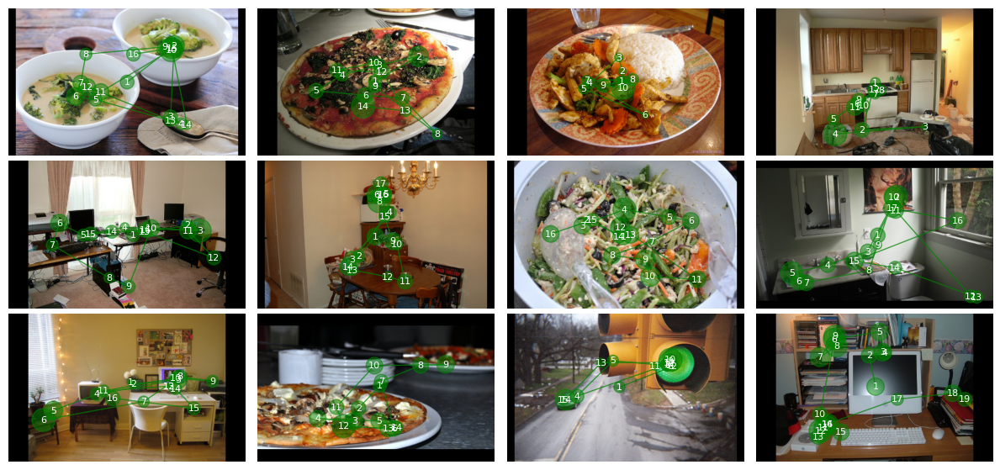

In [18]:
# Get the first 6 .npy.gz files from the directory
semantic_files = sorted(glob.glob('/home/oct/COCO_Search18-and-FV/hatdata/semantic_seq_full/segmentation_maps/*.npy.gz'))[7:19]
freeview_fixations_path = '/home/oct/COCO_Search18-and-FV/hatdata/coco_freeview_fixations_512x320.json'
search_fixations_path = '/home/oct/COCO_Search18-and-FV/hatdata/coco_search_fixations_512x320_on_target_allvalid.json'
image_base_path = '/home/oct/COCO_Search18-and-FV/hatdata/images'

# Initialize lists to store the loaded data
loaded_data = []

fig, axes = plt.subplots(3, 4, figsize=(12, 6))
axes = axes.flatten()

# Loop through the files and load the data
for i, file_path in enumerate(semantic_files):
    semantic, freeview_datas, search_datas, image, base_name = imf.load_data(file_path, freeview_fixations_path, search_fixations_path, image_base_path)

    axes[i].imshow(image)
    axes[i].axis('off')
    imf.draw_fixations(axes[i], freeview_datas[0], 'green', 'Freeview')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()
    

Feature Keys: ['gray_map', 'low_brightness', 'mid_brightness', 'high_brightness', 'horizontal_orientation', 'vertical_orientation', 'texture_features', 'red_channel', 'green_channel', 'blue_channel', 'color_main_regions', 'color_contrast_regions', 'color_kmeans_regions', 'contours', 'spatial_features', 'semantic_image']
Metrics: ['KLdiv', 'NSS', 'CC', 'SIM', 'InfoGain']


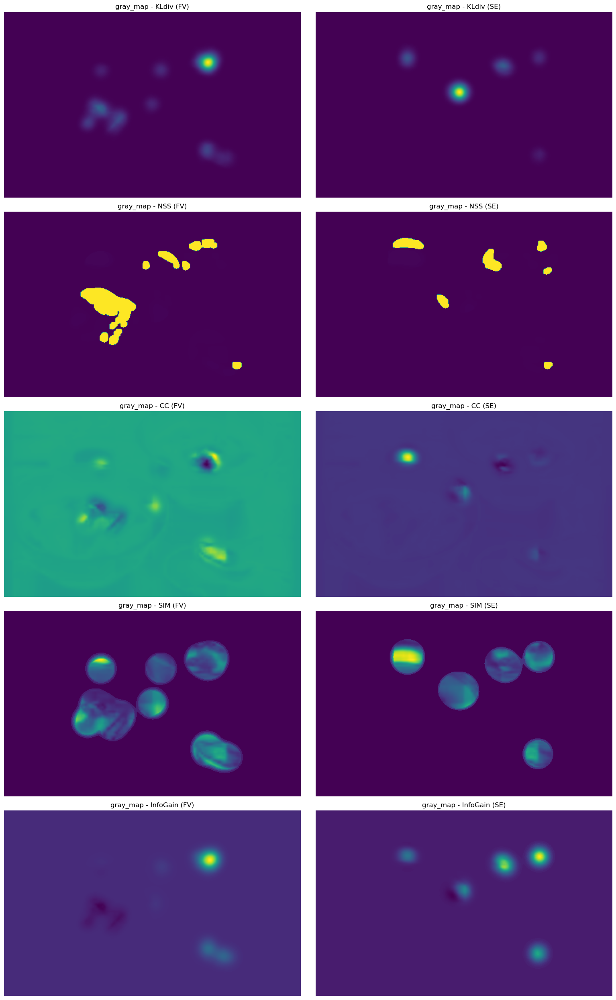

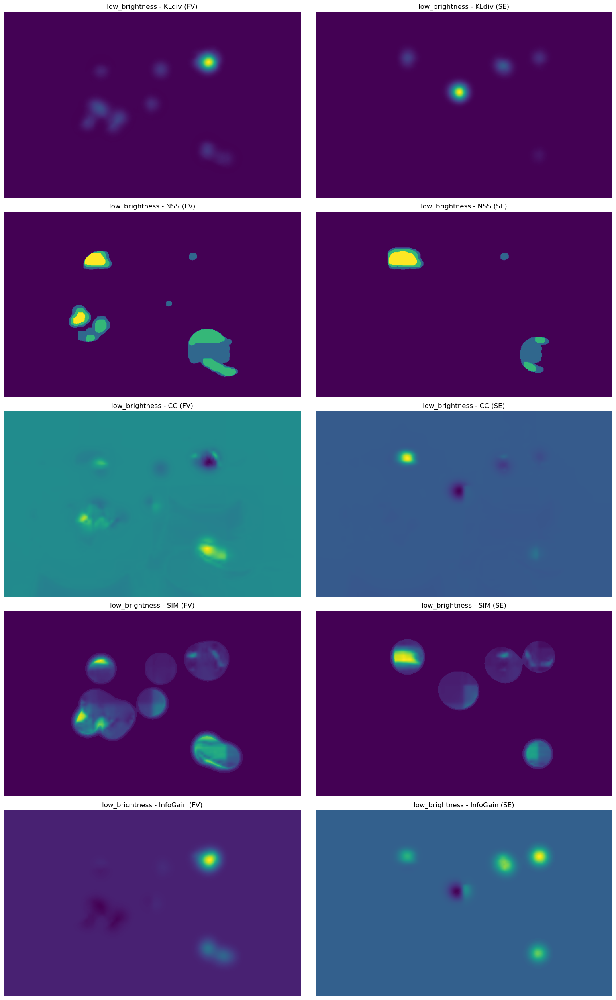

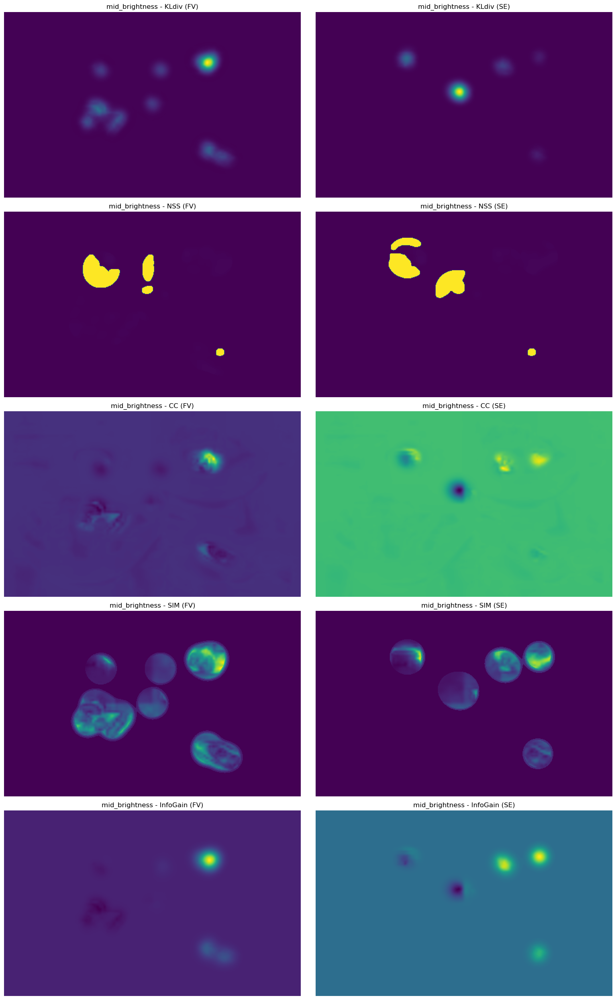

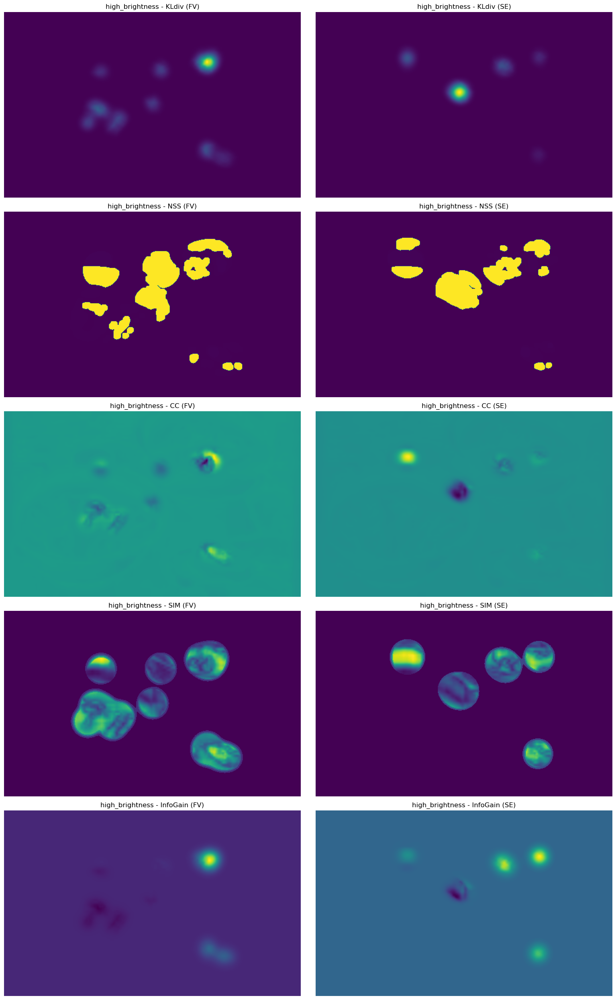

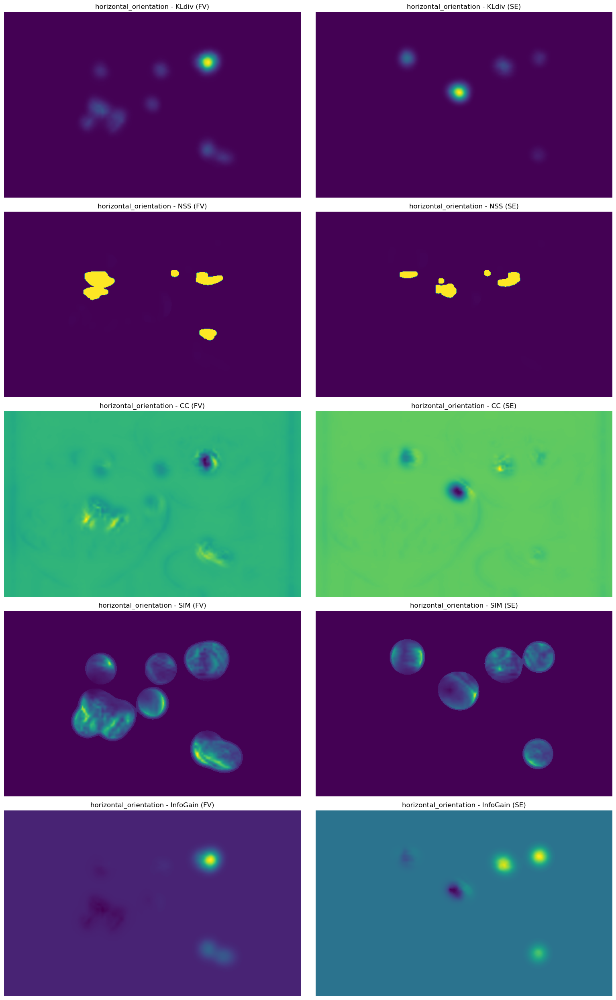

...

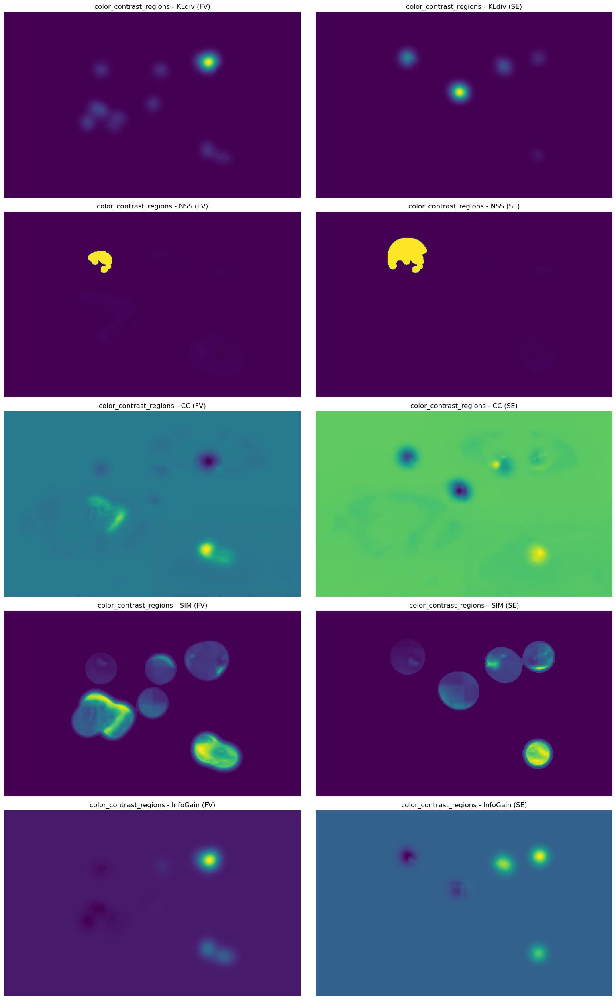

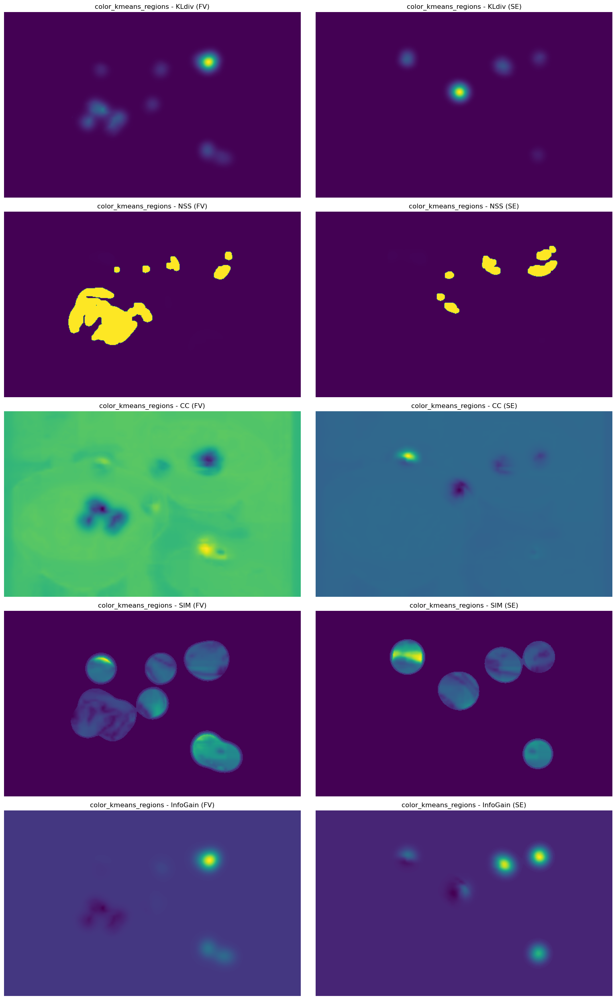

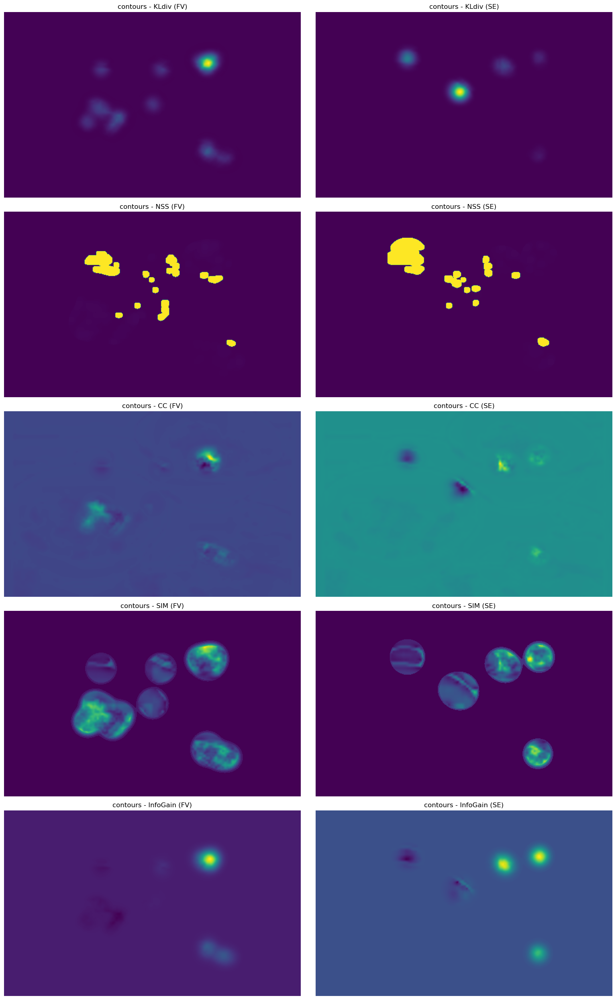

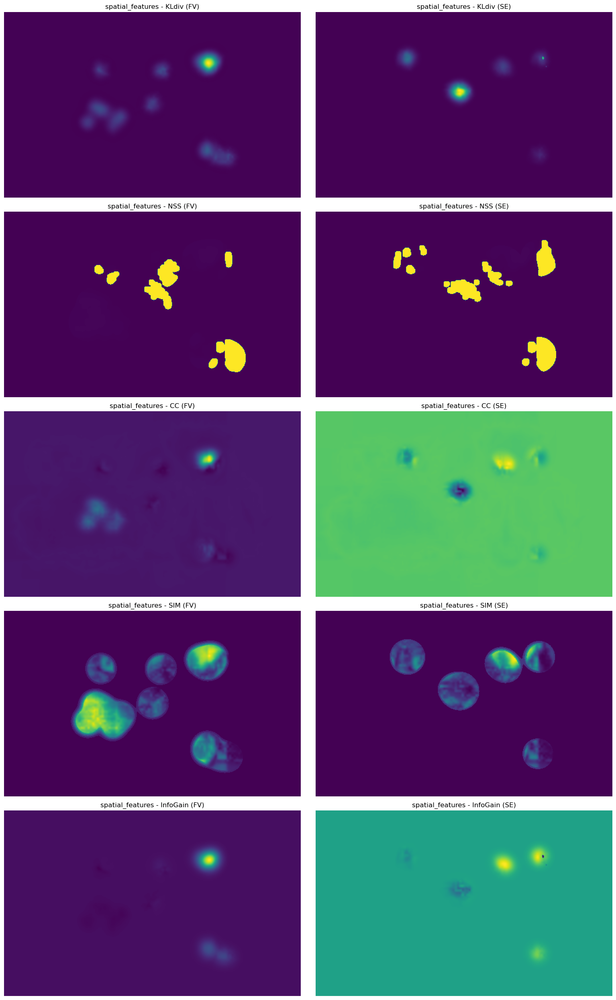

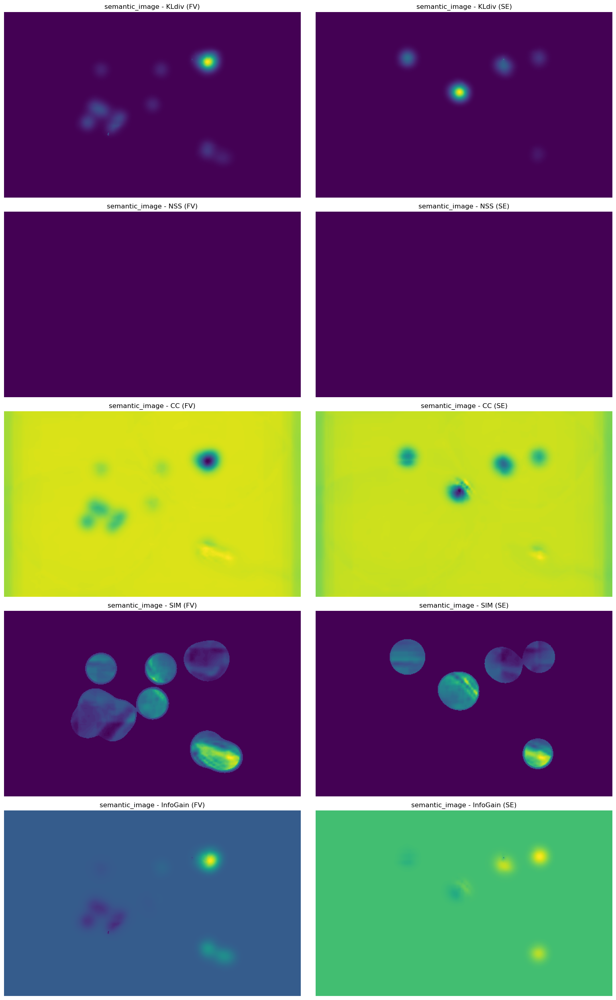

In [16]:
semantic_files = sorted(glob.glob('/home/oct/COCO_Search18-and-FV/hatdata/semantic_seq_full/segmentation_maps/*.npy.gz'))[7:8]
freeview_fixations_path = '/home/oct/COCO_Search18-and-FV/hatdata/coco_freeview_fixations_512x320.json'
search_fixations_path = '/home/oct/COCO_Search18-and-FV/hatdata/coco_search_fixations_512x320_on_target_allvalid.json'
image_base_path = '/home/oct/COCO_Search18-and-FV/hatdata/images'

# Initialize lists to store the loaded data
loaded_data = []

# Loop through the files and load the data
for file_path in semantic_files:
    semantic, freeview_datas, search_datas, image, base_name = imf.load_data(file_path, freeview_fixations_path, search_fixations_path, image_base_path)

    # Combine all low-level and mid-level features into a single dictionary
    low_features = imf.extract_low_level_features(image)
    mid_features = imf.extract_mid_level_features(low_features['gray_map'])
    high_features = imf.extract_high_level_features(semantic)
    
    img_features = imf.combine_features(low_features, mid_features, high_features)

    # Generate saliency maps for all features and store them
    sal_images = {}
    for feature_name, feature_image in img_features.items():
        saliency_map = itti.itti(feature_image)
        sal_images[feature_name] = saliency_map

    # Call the function to display the original image and saliency maps
    #display_all_features(img_features,image)
    #display_fea#sal(sal_image#)
    
    #plot_fixations_and_heatmaps(image, freeview_datas, search_datas)

    #display_all_images(semantic, image, freeview_datas[0], search_datas[0], low_features, mid_features,  high_features)

    #display_all_saliency_images(sal_images)


    hp_fv = imf.generate_heatmap(image, freeview_datas[0], sigma=10)
    hp_se = imf.generate_heatmap(image, search_datas[0], sigma=10)

    _, fv_sim = imf.calculate_similarities(hp_fv, sal_images, image, to_plot=True)
    _, se_sim = imf.calculate_similarities(hp_se, sal_images, image, to_plot=True)

    # Extract and print the keys of features and metrics from fv_sim
    feature_keys = list(fv_sim.keys())
    print("Feature Keys:", feature_keys)

    metric_keys = list(fv_sim[feature_keys[0]].keys())
    print(f"Metrics:", metric_keys)

    for feature in feature_keys:
        # Initialize a figure for the current feature
        fig, axes = plt.subplots(len(metric_keys), 2, figsize=(16, 5 * len(metric_keys)))

        for row, metric in enumerate(metric_keys):
            fv_metric_image = fv_sim[feature][metric]
            se_metric_image = se_sim[feature][metric]

            # Plot Freeview metric
            axes[row, 0].imshow(fv_metric_image, cmap='viridis')
            axes[row, 0].set_title(f"{feature} - {metric} (FV)")
            axes[row, 0].axis('off')

            # Plot Search metric
            axes[row, 1].imshow(se_metric_image, cmap='viridis')
            axes[row, 1].set_title(f"{feature} - {metric} (SE)")
            axes[row, 1].axis('off')

        # Adjust layout and show the plot
        plt.tight_layout()
        plt.show()


Feature Keys: ['gray_map', 'low_brightness', 'mid_brightness', 'high_brightness', 'horizontal_orientation', 'vertical_orientation', 'texture_features', 'red_channel', 'green_channel', 'blue_channel', 'color_main_regions', 'color_contrast_regions', 'color_kmeans_regions', 'contours', 'spatial_features', 'semantic_image']
Metrics: ['KLdiv', 'NSS', 'CC', 'SIM', 'InfoGain']


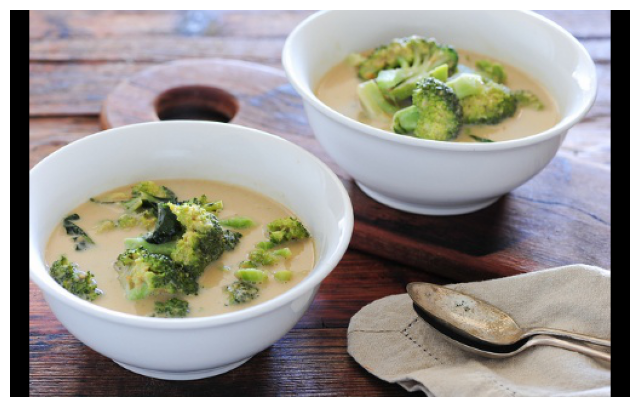

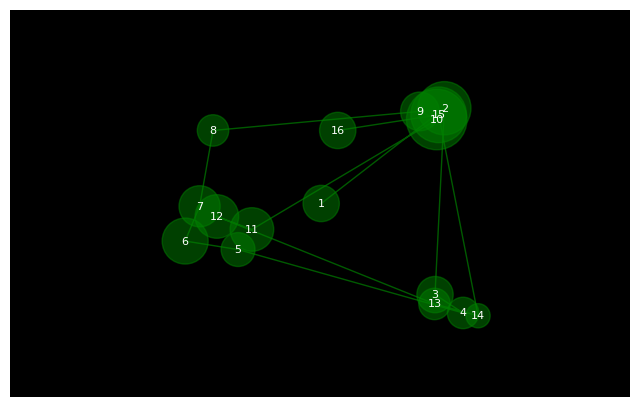

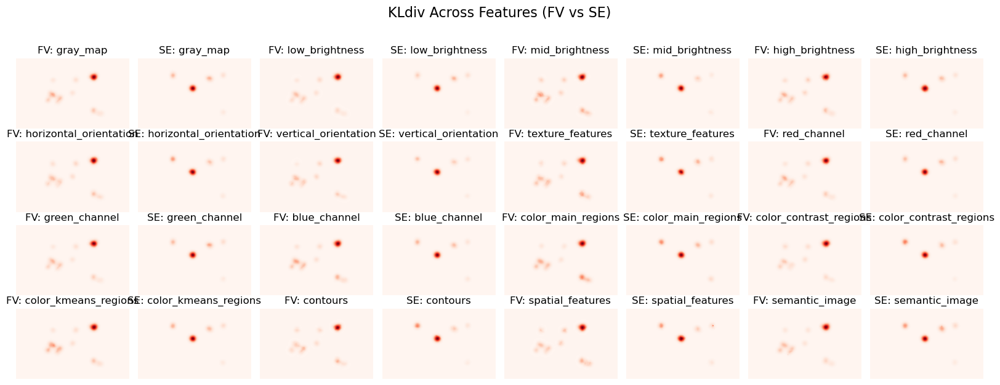

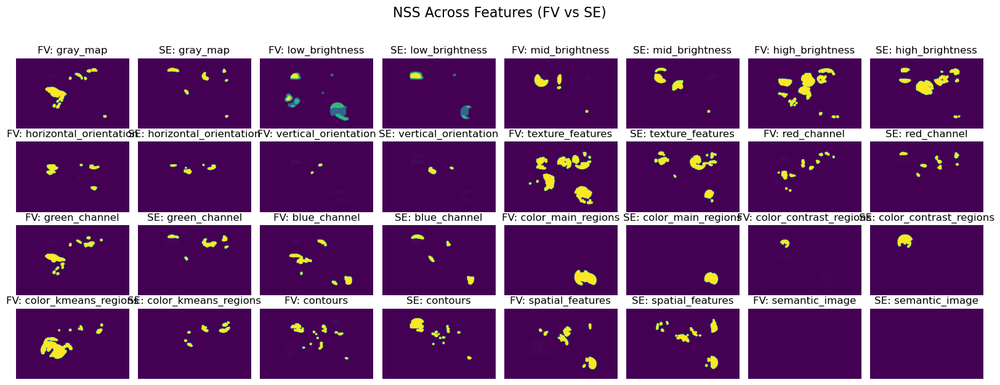

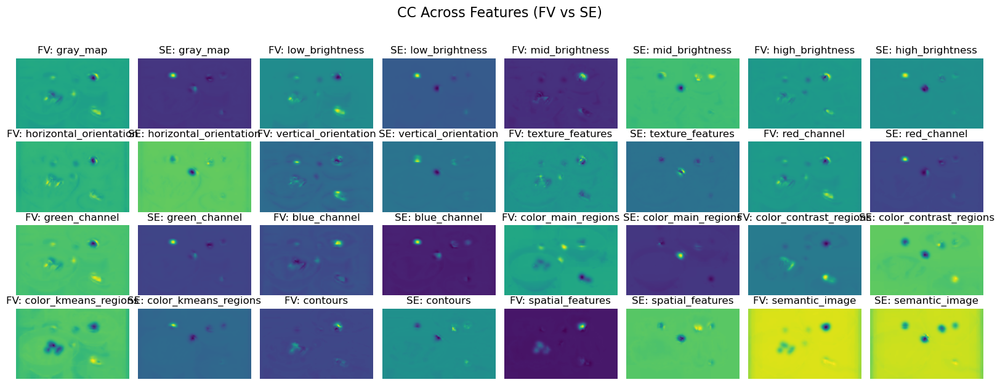

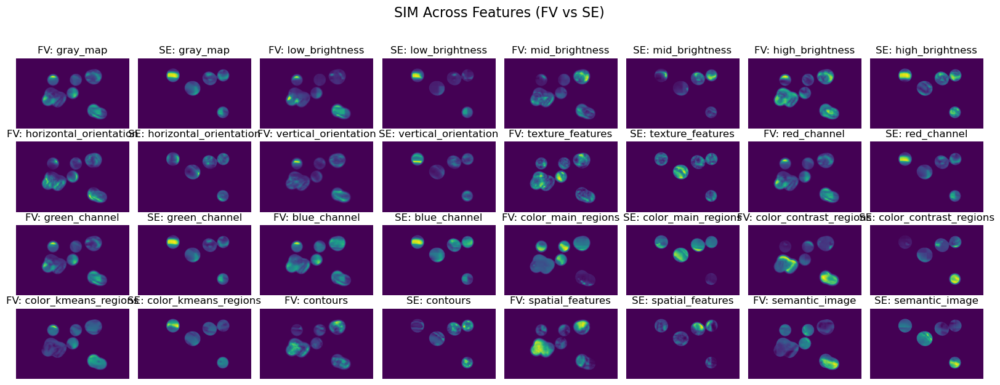

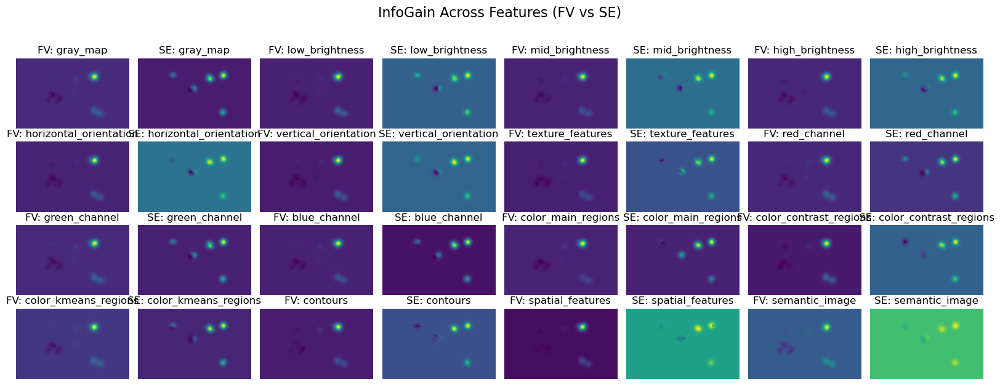

In [ ]:
# Get the first 6 .npy.gz files from the directory
semantic_files = sorted(glob.glob('/home/oct/COCO_Search18-and-FV/hatdata/semantic_seq_full/segmentation_maps/*.npy.gz'))[:16]
freeview_fixations_path = '/home/oct/COCO_Search18-and-FV/hatdata/coco_freeview_fixations_512x320.json'
search_fixations_path = '/home/oct/COCO_Search18-and-FV/hatdata/coco_search_fixations_512x320_on_target_allvalid.json'
image_base_path = '/home/oct/COCO_Search18-and-FV/hatdata/images'

# Initialize lists to store the loaded data
loaded_data = []

# Loop through the files and load the data
for file_path in semantic_files:
    semantic, freeview_datas, search_datas, image, base_name = imf.load_data(file_path, freeview_fixations_path, search_fixations_path, image_base_path)

    
    # Combine all low-level and mid-level features into a single dictionary
    low_features = imf.extract_low_level_features(image)
    mid_features = imf.extract_mid_level_features(low_features['gray_map'])
    high_features = imf.extract_high_level_features(semantic)
    img_features = imf.combine_features(low_features, mid_features, high_features)

    # Generate saliency maps for all features and store them
    sal_images = {}
    for feature_name, feature_image in img_features.items():
        saliency_map = itti.itti(feature_image)
        sal_images[feature_name] = saliency_map

    # Call the function to display the original image and saliency maps
    display_all_features(img_features,image)
    display_fea_sal(sal_images)
    
    plot_fixations_and_heatmaps(image, freeview_datas, search_datas)

    
    fig1, ax1 = plt.subplots(1, 1, figsize=(8, 8))
    ax1.imshow(image)
    ax1.axis('off')
    
    fig2, ax2 = plt.subplots(1, 1, figsize=(8, 8))
    img0 = np.zeros_like(image)
    ax2.imshow(img0)
    imf.draw_fixations(ax2,freeview_datas[0], 'green', 'Freeview')


    hp_fv = imf.generate_heatmap(image, freeview_datas[0], sigma=10)
    hp_se = imf.generate_heatmap(image, search_datas[0], sigma=10)

    _, fv_sim = imf.calculate_similarities(hp_fv, sal_images, image, to_plot=True)
    _, se_sim = imf.calculate_similarities(hp_se, sal_images, image, to_plot=True)

    # Extract and print the keys of features and metrics from fv_sim
    feature_keys = list(fv_sim.keys())
    print("Feature Keys:", feature_keys)

    metric_keys = list(fv_sim[feature_keys[0]].keys())
    print(f"Metrics:", metric_keys)

    for metric in metric_keys:
        # Initialize a list to store images for the current metric
        fv_metric_images = [fv_sim[feature][metric] for feature in feature_keys]
        se_metric_images = [se_sim[feature][metric] for feature in feature_keys]

        # Determine the grid size for displaying all feature images
        num_features = len(feature_keys)
        grid_cols = 4  # Number of columns in the grid
        grid_rows = (num_features + grid_cols - 1) // grid_cols  # Calculate rows needed

        # Create a figure for the current metric
        fig, axes = plt.subplots(grid_rows, grid_cols * 2, figsize=(16, 1.6 * grid_rows))
        axes = axes.flatten()

        # Plot each feature's image for the current metric
        for i, (fv_image, se_image, feature_name) in enumerate(zip(fv_metric_images, se_metric_images, feature_keys)):
            cmap = 'Reds' if metric == 'KLdiv' else 'viridis'
            
            # Display Freeview image
            ax_fv = axes[2 * i]
            ax_fv.imshow(fv_image, cmap=cmap)
            ax_fv.set_title(f"FV: {feature_name}")
            ax_fv.axis('off')
            
            # Display Search image
            ax_se = axes[2 * i + 1]
            ax_se.imshow(se_image, cmap=cmap)
            ax_se.set_title(f"SE: {feature_name}")
            ax_se.axis('off')

        # Hide any unused subplots
        for ax in axes[2 * num_features:]:
            ax.axis('off')

        # Add a main title for the metric
        fig.suptitle(f"{metric} Across Features (FV vs SE)", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()
    

In [4]:
# Load JSON files from the result folder
result_folder = '/home/oct/COCO_Search18-and-FV/hatdata/result'
json_files = [os.path.join(result_folder, f) for f in os.listdir(result_folder) if f.endswith('.json')]

# Initialize dictionaries to store data
freeview_similarity_results = {}
search_similarity_results = {}

# Load data from JSON files
for json_file in json_files:
    with open(json_file, 'r') as f:
        data = json.load(f)
        # Flatten the structure by removing the subject ID layer
        if 'freeview_similarity_results' in data:
            for subject_id, features in data['freeview_similarity_results'].items():
                for feature, metrics in features.items():
                    if feature not in freeview_similarity_results:
                        freeview_similarity_results[feature] = {metric: [] for metric in metrics.keys()}
                    for metric, value in metrics.items():
                        freeview_similarity_results[feature][metric].append(value)
        
        if 'search_similarity_results' in data:
            for subject_id, features in data['search_similarity_results'].items():
                for feature, metrics in features.items():
                    if feature not in search_similarity_results:
                        search_similarity_results[feature] = {metric: [] for metric in metrics.keys()}
                    for metric, value in metrics.items():
                        search_similarity_results[feature][metric].append(value)

features = list(freeview_similarity_results.keys())
metrics = list(freeview_similarity_results.values())[0].keys()



In [5]:
import numpy as np
def show_distribution(results,feature_name, metric_name):
    data = results[f'{feature_name}'][f'{metric_name}']
    print("NaN count:", np.isnan(data).sum())
    # Remove NaN values
    # Convert to a NumPy array if not already
    cleaned = np.array(data)[~np.isnan(data)]

    # Calculate mean and standard deviation
    mean = np.mean(cleaned)
    std = np.std(cleaned)

    print("Mean:", mean)
    print("Standard Deviation:", std)
    # Plot the distribution of data
    plt.figure(figsize=(10, 6))
    plt.hist(cleaned, bins=30, alpha=0.7, color='blue', edgecolor='black')
    plt.title(f'Distribution of {feature_name}', fontsize=14)
    plt.xlabel(f'{metric_name}', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.grid(axis='y', alpha=0.75)
    plt.show()

In [6]:
import pandas as pd
from IPython.display import display

def get_results(results):
    r = {}
    for feature, metrics in results.items():
        r[feature] = {}
        for metric, values in metrics.items():
            # Remove NaN values
            values = np.array(values)
            values = values[~np.isnan(values)]
            
            # Normalize values to range [0, 1]
            #if len(values) > 0:
            #    values = (values - np.min(values)) / (np.max(values) - np.min(values) + 1e-6)
            
            # Calculate mean and standard deviation
            mean = np.mean(values)
            std = np.std(values)
            #print(f"{feature}: {metric}: {mean:.4f} +/- {std:.4f}")
            r[feature][metric] = (mean, std)
    return r

def print_results(rs1, rs2, metrics):
    for metric in metrics:
        # Prepare data for the current metric
        data = {
            'Feature': list(rs1.keys()),
            'RS1_Mean': [rs1[feature][metric][0] for feature in rs1.keys()],
            'RS2_Mean': [rs2[feature][metric][0] for feature in rs2.keys()],
            'RS1_Std': [rs1[feature][metric][1] for feature in rs1.keys()],
            'RS2_Std': [rs2[feature][metric][1] for feature in rs2.keys()]
        }

        # Create a DataFrame
        df = pd.DataFrame(data)

        # Display the table
        print(f"Metric: {metric}")
        display(df)

        # Convert the DataFrame to LaTeX format and print
        latex_code = df.to_latex(index=False, float_format="%.4f")
        print("LaTeX Format:")
        print(latex_code)



In [7]:
fr = get_results(freeview_similarity_results)
sr = get_results(search_similarity_results)
features = list(fr.keys())
metrics = list(next(iter(fr.values())).keys())
print("Features:", features)
print("Metrics:", metrics)
print_results(fr, sr, metrics)

Features: ['gray_map', 'low_brightness', 'mid_brightness', 'high_brightness', 'horizontal_orientation', 'vertical_orientation', 'texture_features', 'red_channel', 'green_channel', 'blue_channel', 'color_main_regions', 'color_contrast_regions', 'color_kmeans_regions', 'contours', 'spatial_features', 'semantic_image']
Metrics: ['KLdiv', 'NSS', 'CC', 'SIM', 'InfoGain']
Metric: KLdiv


,Feature,RS1_Mean,RS2_Mean,RS1_Std,RS2_Std
0,gray_map,2.850290,3.655998,0.474557,0.567447
1,low_brightness,2.890261,3.618998,0.851956,0.879853
2,mid_brightness,2.719836,3.557011,0.489760,0.613616
3,high_brightness,2.804163,3.653717,1.182648,1.256454
4,horizontal_orientation,2.624384,3.487277,0.507876,0.630212
5,vertical_orientation,2.417561,3.249185,0.466863,0.574913
6,texture_features,2.852672,3.672108,0.444149,0.515569
7,red_channel,2.807712,3.608696,0.480132,0.569736
8,green_channel,2.831494,3.645306,0.468367,0.569751
9,blue_channel,2.892706,3.699774,0.492694,0.582698


LaTeX Format:
\begin{tabular}{lrrrr}
\toprule
Feature & RS1_Mean & RS2_Mean & RS1_Std & RS2_Std \\
\midrule
gray_map & 2.8503 & 3.6560 & 0.4746 & 0.5674 \\
low_brightness & 2.8903 & 3.6190 & 0.8520 & 0.8799 \\
mid_brightness & 2.7198 & 3.5570 & 0.4898 & 0.6136 \\
high_brightness & 2.8042 & 3.6537 & 1.1826 & 1.2565 \\
horizontal_orientation & 2.6244 & 3.4873 & 0.5079 & 0.6302 \\
vertical_orientation & 2.4176 & 3.2492 & 0.4669 & 0.5749 \\
texture_features & 2.8527 & 3.6721 & 0.4441 & 0.5156 \\
red_channel & 2.8077 & 3.6087 & 0.4801 & 0.5697 \\
green_channel & 2.8315 & 3.6453 & 0.4684 & 0.5698 \\
blue_channel & 2.8927 & 3.6998 & 0.4927 & 0.5827 \\
color_main_regions & 2.8107 & 3.6629 & 0.5876 & 0.7024 \\
color_contrast_regions & 3.8053 & 4.4036 & 3.0513 & 3.0489 \\
color_kmeans_regions & 2.8257 & 3.7066 & 0.5167 & 0.6543 \\
contours & 2.5117 & 3.3909 & 0.9528 & 0.8974 \\
spatial_features & 2.4894 & 3.3566 & 0.5147 & 0.7626 \\
semantic_image & 3.1244 & 3.7000 & 1.5235 & 1.4445 \\
\bottomru

,Feature,RS1_Mean,RS2_Mean,RS1_Std,RS2_Std
0,gray_map,-0.136765,-0.063345,0.304541,0.379920
1,low_brightness,0.064888,0.177879,0.395460,0.498851
2,mid_brightness,0.066482,0.109482,0.346056,0.428698
3,high_brightness,0.192832,0.212848,0.401814,0.504514
4,horizontal_orientation,0.219236,0.258197,0.324267,0.418172
5,vertical_orientation,0.475038,0.557444,0.344776,0.450831
6,texture_features,-0.147437,-0.081313,0.315295,0.404267
7,red_channel,-0.083198,-0.001689,0.326639,0.407385
8,green_channel,-0.120092,-0.050659,0.307580,0.388379
9,blue_channel,-0.169905,-0.101169,0.316991,0.391790


LaTeX Format:
\begin{tabular}{lrrrr}
\toprule
Feature & RS1_Mean & RS2_Mean & RS1_Std & RS2_Std \\
\midrule
gray_map & -0.1368 & -0.0633 & 0.3045 & 0.3799 \\
low_brightness & 0.0649 & 0.1779 & 0.3955 & 0.4989 \\
mid_brightness & 0.0665 & 0.1095 & 0.3461 & 0.4287 \\
high_brightness & 0.1928 & 0.2128 & 0.4018 & 0.5045 \\
horizontal_orientation & 0.2192 & 0.2582 & 0.3243 & 0.4182 \\
vertical_orientation & 0.4750 & 0.5574 & 0.3448 & 0.4508 \\
texture_features & -0.1474 & -0.0813 & 0.3153 & 0.4043 \\
red_channel & -0.0832 & -0.0017 & 0.3266 & 0.4074 \\
green_channel & -0.1201 & -0.0507 & 0.3076 & 0.3884 \\
blue_channel & -0.1699 & -0.1012 & 0.3170 & 0.3918 \\
color_main_regions & 0.0404 & 0.0557 & 0.4141 & 0.4933 \\
color_contrast_regions & 0.1257 & 0.2136 & 0.4704 & 0.6110 \\
color_kmeans_regions & -0.1418 & -0.1504 & 0.3920 & 0.4677 \\
contours & 0.4342 & 0.4443 & 0.3804 & 0.4864 \\
spatial_features & 0.4815 & 0.5480 & 0.4509 & 0.6153 \\
semantic_image & 0.0503 & 0.2776 & 0.5051 & 0.6315 

,Feature,RS1_Mean,RS2_Mean,RS1_Std,RS2_Std
0,gray_map,-0.029281,-0.005462,0.086504,0.068423
1,low_brightness,0.018014,0.035460,0.111800,0.091355
2,mid_brightness,0.013097,0.018216,0.097000,0.077376
3,high_brightness,0.047408,0.030433,0.112370,0.085996
4,horizontal_orientation,0.059965,0.044066,0.093532,0.076053
5,vertical_orientation,0.126112,0.093856,0.101621,0.085350
6,texture_features,-0.041579,-0.013345,0.087551,0.075516
7,red_channel,-0.015219,0.005832,0.092587,0.074406
8,green_channel,-0.024826,-0.003189,0.087585,0.070142
9,blue_channel,-0.038207,-0.012103,0.089432,0.069543


LaTeX Format:
\begin{tabular}{lrrrr}
\toprule
Feature & RS1_Mean & RS2_Mean & RS1_Std & RS2_Std \\
\midrule
gray_map & -0.0293 & -0.0055 & 0.0865 & 0.0684 \\
low_brightness & 0.0180 & 0.0355 & 0.1118 & 0.0914 \\
mid_brightness & 0.0131 & 0.0182 & 0.0970 & 0.0774 \\
high_brightness & 0.0474 & 0.0304 & 0.1124 & 0.0860 \\
horizontal_orientation & 0.0600 & 0.0441 & 0.0935 & 0.0761 \\
vertical_orientation & 0.1261 & 0.0939 & 0.1016 & 0.0854 \\
texture_features & -0.0416 & -0.0133 & 0.0876 & 0.0755 \\
red_channel & -0.0152 & 0.0058 & 0.0926 & 0.0744 \\
green_channel & -0.0248 & -0.0032 & 0.0876 & 0.0701 \\
blue_channel & -0.0382 & -0.0121 & 0.0894 & 0.0695 \\
color_main_regions & 0.0084 & 0.0071 & 0.1133 & 0.0837 \\
color_contrast_regions & 0.0369 & 0.0408 & 0.1348 & 0.1118 \\
color_kmeans_regions & -0.0333 & -0.0237 & 0.1113 & 0.0833 \\
contours & 0.1370 & 0.0842 & 0.1243 & 0.1008 \\
spatial_features & 0.1407 & 0.0948 & 0.1331 & 0.1108 \\
semantic_image & 0.0223 & 0.0583 & 0.1425 & 0.1133 \

,Feature,RS1_Mean,RS2_Mean,RS1_Std,RS2_Std
0,gray_map,0.115285,0.059811,0.035339,0.029348
1,low_brightness,0.127906,0.069118,0.045779,0.037834
2,mid_brightness,0.130339,0.066507,0.039478,0.032662
3,high_brightness,0.140895,0.071065,0.049661,0.037038
4,horizontal_orientation,0.141833,0.072905,0.043664,0.036596
5,vertical_orientation,0.165118,0.086497,0.047922,0.040600
6,texture_features,0.115422,0.059144,0.034137,0.027579
7,red_channel,0.119468,0.062252,0.036495,0.030453
8,green_channel,0.116833,0.060419,0.035296,0.029608
9,blue_channel,0.112252,0.058231,0.035717,0.029160


LaTeX Format:
\begin{tabular}{lrrrr}
\toprule
Feature & RS1_Mean & RS2_Mean & RS1_Std & RS2_Std \\
\midrule
gray_map & 0.1153 & 0.0598 & 0.0353 & 0.0293 \\
low_brightness & 0.1279 & 0.0691 & 0.0458 & 0.0378 \\
mid_brightness & 0.1303 & 0.0665 & 0.0395 & 0.0327 \\
high_brightness & 0.1409 & 0.0711 & 0.0497 & 0.0370 \\
horizontal_orientation & 0.1418 & 0.0729 & 0.0437 & 0.0366 \\
vertical_orientation & 0.1651 & 0.0865 & 0.0479 & 0.0406 \\
texture_features & 0.1154 & 0.0591 & 0.0341 & 0.0276 \\
red_channel & 0.1195 & 0.0623 & 0.0365 & 0.0305 \\
green_channel & 0.1168 & 0.0604 & 0.0353 & 0.0296 \\
blue_channel & 0.1123 & 0.0582 & 0.0357 & 0.0292 \\
color_main_regions & 0.1264 & 0.0637 & 0.0435 & 0.0329 \\
color_contrast_regions & 0.1278 & 0.0704 & 0.0638 & 0.0467 \\
color_kmeans_regions & 0.1183 & 0.0584 & 0.0363 & 0.0288 \\
contours & 0.1578 & 0.0791 & 0.0458 & 0.0385 \\
spatial_features & 0.1573 & 0.0805 & 0.0434 & 0.0376 \\
semantic_image & 0.1235 & 0.0701 & 0.0525 & 0.0376 \\
\bottomru

,Feature,RS1_Mean,RS2_Mean,RS1_Std,RS2_Std
0,gray_map,2.559444,2.739314,2.204315,3.740898
1,low_brightness,2.501779,2.792693,2.371963,3.855759
2,mid_brightness,2.747649,2.882121,2.164347,3.722526
3,high_brightness,2.625992,2.742604,2.579282,3.931259
4,horizontal_orientation,2.885358,2.982727,2.197319,3.756682
5,vertical_orientation,3.183741,3.326220,2.150941,3.681032
6,texture_features,2.556007,2.716072,2.175574,3.694305
7,red_channel,2.620871,2.807556,2.193145,3.730749
8,green_channel,2.586562,2.754738,2.198998,3.736750
9,blue_channel,2.498251,2.676158,2.229775,3.758449


LaTeX Format:
\begin{tabular}{lrrrr}
\toprule
Feature & RS1_Mean & RS2_Mean & RS1_Std & RS2_Std \\
\midrule
gray_map & 2.5594 & 2.7393 & 2.2043 & 3.7409 \\
low_brightness & 2.5018 & 2.7927 & 2.3720 & 3.8558 \\
mid_brightness & 2.7476 & 2.8821 & 2.1643 & 3.7225 \\
high_brightness & 2.6260 & 2.7426 & 2.5793 & 3.9313 \\
horizontal_orientation & 2.8854 & 2.9827 & 2.1973 & 3.7567 \\
vertical_orientation & 3.1837 & 3.3262 & 2.1509 & 3.6810 \\
texture_features & 2.5560 & 2.7161 & 2.1756 & 3.6943 \\
red_channel & 2.6209 & 2.8076 & 2.1931 & 3.7307 \\
green_channel & 2.5866 & 2.7547 & 2.1990 & 3.7367 \\
blue_channel & 2.4983 & 2.6762 & 2.2298 & 3.7584 \\
color_main_regions & 2.6166 & 2.7293 & 2.2153 & 3.7408 \\
color_contrast_regions & 1.1817 & 1.6607 & 4.9188 & 5.7811 \\
color_kmeans_regions & 2.5949 & 2.6663 & 2.2073 & 3.7580 \\
contours & 3.0479 & 3.1218 & 2.4771 & 3.8367 \\
spatial_features & 3.0801 & 3.1713 & 2.1628 & 3.7362 \\
semantic_image & 2.1640 & 2.6759 & 3.1238 & 4.1321 \\
\bottomru

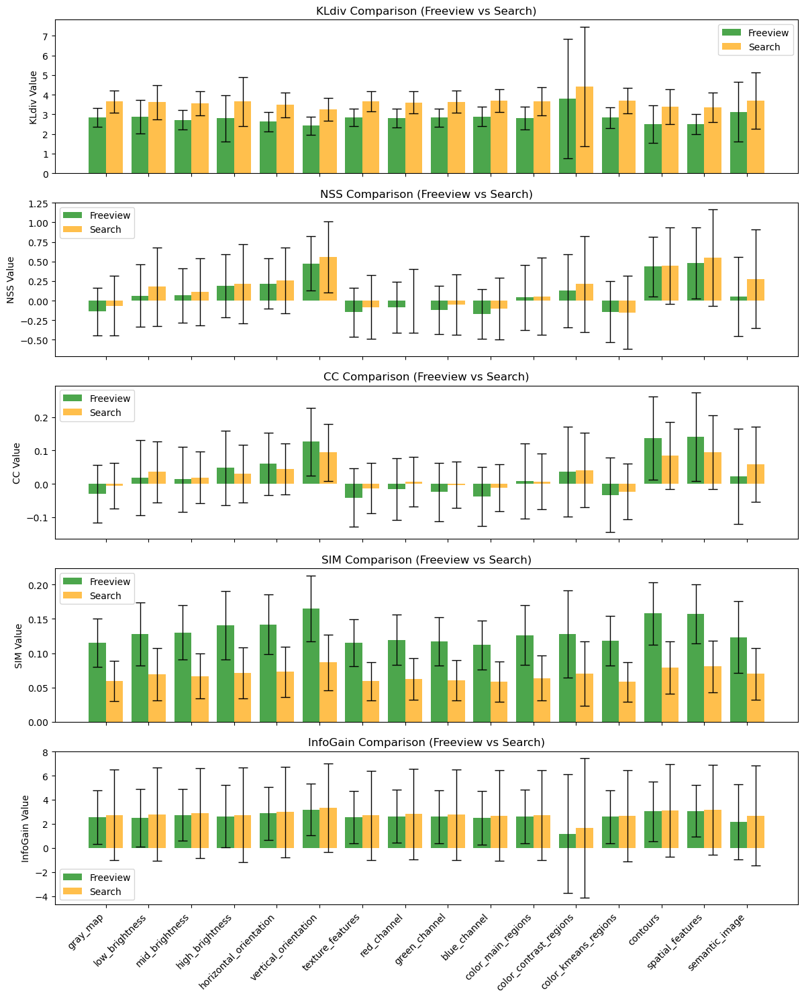

In [56]:
import numpy as np
import matplotlib.pyplot as plt

# 定义颜色
fr_color = 'green'
sr_color = 'orange'

# 设置图像大小和子图布局
fig, axes = plt.subplots(len(metrics), 1, figsize=(12, 3 * len(metrics)), sharex=True)

# 遍历每个指标并绘制
for ax, metric in zip(axes, metrics):
    fr_means = [fr[feature][metric][0] for feature in fr.keys()]
    fr_stds = [fr[feature][metric][1] for feature in fr.keys()]
    sr_means = [sr[feature][metric][0] for feature in sr.keys()]
    sr_stds = [sr[feature][metric][1] for feature in sr.keys()]
    features = list(fr.keys())

    x = np.arange(len(features))  # X轴位置

    # 绘制柱状图
    ax.bar(x - 0.2, fr_means, yerr=fr_stds, width=0.4, color=fr_color, alpha=0.7, label='Freeview', capsize=5, error_kw=dict(ecolor='black', lw=1))
    ax.bar(x + 0.2, sr_means, yerr=sr_stds, width=0.4, color=sr_color, alpha=0.7, label='Search', capsize=5, error_kw=dict(ecolor='black', lw=1))

    # 添加标签和标题
    ax.set_ylabel(f'{metric} Value')
    ax.set_title(f'{metric} Comparison (Freeview vs Search)')
    ax.legend()

# 设置最后一个子图的X轴标签
axes[-1].set_xticks(x)
axes[-1].set_xticklabels(features, rotation=45, ha='right')

# 调整布局以避免重叠
plt.tight_layout()

# 保存图片并显示
plt.savefig('comparison_plot.png', dpi=150)  # 调整dpi以控制图片大小
plt.show()